# Dimension reduction

In [1]:
# import numpy, umap, matplotlib
import numpy, matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

In [2]:
def loadpwds():
    pc1 = numpy.load(f'./pw_pc1.npy')
    pc2 = numpy.load(f'./pw_pc2.npy')
    return pc1, pc2
    

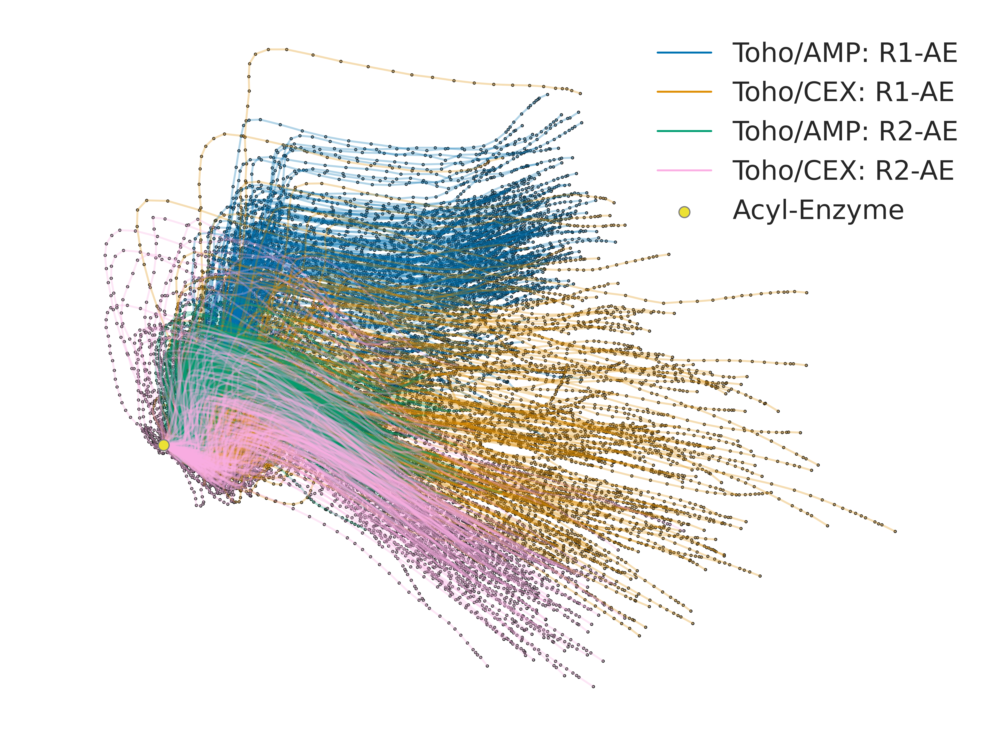

In [7]:
# init figure ==================================================================
sns.set_style(style='white')
fig, ax,  = plt.subplots(figsize=(7.5, 6), dpi=900, facecolor='w', edgecolor='k', )
plt.subplots_adjust(left=1./7.5, right=6.5/7.5, top=5/6, bottom=1/6)
plt.axis('off')

d1, d2 = loadpwds()

for i in range(800):
    color=None
    if   i < 200:             color=sns.color_palette('colorblind')[0]
    elif i < 400 and i >=200: color=sns.color_palette('colorblind')[1]
    elif i < 600 and i >=400: color=sns.color_palette('colorblind')[2]
    elif i >=600:             color=sns.color_palette('colorblind')[6]

    line, = ax.plot(d1[i*50:(i+1)*50], 
                    d2[i*50:(i+1)*50],
                    linestyle='-', c=color, linewidth=0.8, alpha=0.3, zorder=2, )

    if i in [0, 200, 400, 600, ]:
        if   i == 0:   sysname = 'Toho/AMP: R1-AE'
        elif i == 200: sysname = 'Toho/CEX: R1-AE'
        elif i == 400: sysname = 'Toho/AMP: R2-AE'
        elif i == 600: sysname = 'Toho/CEX: R2-AE'
        
        line.set_label(sysname)

ax.scatter(d1, d2, c='k', s=0.1, zorder=1, )
ax.scatter(d1[49], d2[49], s=20, color=sns.color_palette('colorblind')[8], zorder=3, label='Acyl-Enzyme', edgecolors='gray', linewidth=0.5, )

ax.set(yticks=[])
ax.set(xticks=[])

# legend 
handles, labels = ax.get_legend_handles_labels()
        
leg = plt.legend(loc='upper right', bbox_to_anchor=(1., 1.) , frameon=False)

for legobj in leg.legendHandles:
    legobj.set_alpha(1.)

ax.axis('equal')

fig.savefig(f'./pw_pca.png')
plt.show()